# 1. Import necessary library

In [199]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import interpolate
from sklearn.svm import SVR

# 2. Parameter setting

In [200]:
# concentration of calibrated reference in mM
# ref1: styrene, ref2: styrene oxide, ref3: benzaldehyde
ref1_c = [0.0682, 0.1364, 0.2046, 0.2728, 0.3410]
ref2_c = [0.0686, 0.1372, 0.2058, 0.2744, 0.3430]
ref3_c = [0.0774, 0.1548, 0.2322, 0.3096, 0.3870]

# spectrum fitting range in nm, original data is 200-600 nm
spectrum_low = 220
spectrum_high = 350

# input the path of files
ref_file = 'PBA_reference_calibration_spectra.csv'
sample_file = 'PBA_sample_spectra.csv'

# 3. Loading reference and sample datas

In [201]:
# read calibration datas for all references and cut wavelength range of interests
df_x_origin = pd.read_csv('data/' + ref_file)
df_x_origin = df_x_origin.set_index('Wavelength')
df_x = df_x_origin.loc[str(spectrum_low):str(spectrum_high)]

# generating stardard reference spectra at 0.2 mM by interpolation of the calibration data
X = pd.DataFrame(index=df_x.index)

c1 = np.array(ref1_c)
f_ref1 = interpolate.interp1d(c1, df_x[[f'ref1_c{i+1}' for i in range(len(ref1_c))]], bounds_error=False, fill_value="extrapolate")
X['ref1'] = f_ref1(0.2)

c2 = np.array(ref2_c)
f_ref2 = interpolate.interp1d(c2, df_x[[f'ref2_c{i+1}' for i in range(len(ref2_c))]], bounds_error=False, fill_value="extrapolate")
X['ref2'] = f_ref2(0.2)

c3 = np.array(ref3_c)
f_ref3 = interpolate.interp1d(c3, df_x[[f'ref3_c{i+1}' for i in range(len(ref3_c))]], bounds_error=False, fill_value="extrapolate")
X['ref3'] = f_ref3(0.2)

#print(X)

# read sample datas for all references and cut wavelength range of interests
df_y_origin = pd.read_csv('data/' + sample_file)
df_y_origin = df_y_origin.set_index('Wavelength')
y = df_y_origin.loc[str(spectrum_low):str(spectrum_high)]
y = y.subtract(df_x['bkg'], axis=0)

#print(y)

# 4. Plotting standard reference spectra

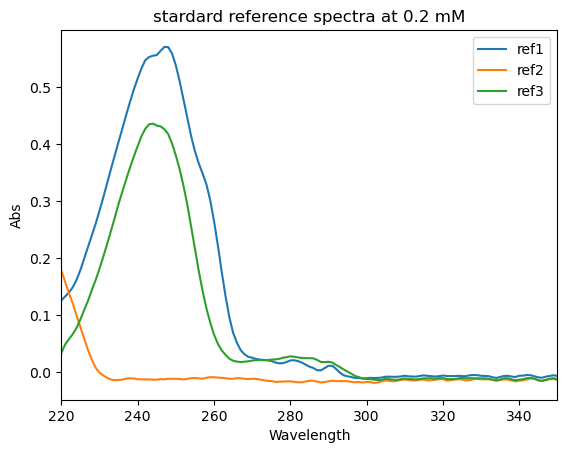

In [202]:
# plot stardard reference spectra at 0.2 mM
for ind, col in X.items():
    sns.lineplot(x=X.index, y=col, label=ind)
plt.xlabel("Wavelength")   
plt.ylabel("Abs")
plt.title("stardard reference spectra at 0.2 mM") 
plt.xlim(spectrum_low, spectrum_high)
plt.legend()
plt.show()

# 5. Spectra unmixing

In [ ]:
coffcient = pd.DataFrame(columns=['ref1', 'ref2', 'ref3'])
y_pred = pd.DataFrame(index=df_x.index, columns=y.columns)

# for PBA system, since there are only 3 distinctive components, so a simplified linear model is used to fit the spectra.
# here, we use a support vector regression model to fit the spectra, where the kernel is set to linear, and the epsilon is set to 0.005 to tolerate minor experimental noise.   
model = SVR(epsilon=0.005, kernel='linear')
for ind, col in y.items():
    model.fit(X, col)
    coffcient.loc[ind] = model.coef_[0]
    y_pred[ind] = model.predict(X)

# a few samples exhibit small negative coffcient for ref3, for these samples we refit the model by fix the cofficient of ref3 to 0. 
pred_dict = {}
for ind, c in enumerate(coffcient['ref3']):
    if c < 0:
        index_label = coffcient.index[ind]
        model.fit(X[['ref1', 'ref2']], y.iloc[:, ind])
        coffcient.loc[index_label, 'ref1'] = model.coef_[0][0]
        coffcient.loc[index_label, 'ref2'] = model.coef_[0][1]
        coffcient.loc[index_label, 'ref3'] = 0
        pred_dict[ind] = model.predict(X[['ref1', 'ref2']])

new_preds = pd.DataFrame(pred_dict, index=X.index)
y_pred.update(new_preds) 

In [ ]:
# converting cofficient to real concentration data, and calculating the yield of epoxide and aldehyde.
real_concentration = 0.2*coffcient 
real_concentration['yield_epox'] = 100 * real_concentration['ref2'] / real_concentration[['ref1', 'ref2', 'ref3']].sum(axis=1)
real_concentration['yield_alde'] = 100 * real_concentration['ref3'] / real_concentration[['ref1', 'ref2', 'ref3']].sum(axis=1)
real_concentration

#real_concentration.to_csv('result/Spectra_unmixing_result.csv')

# 6. Ploting fitting results

In [ ]:
# define parameters and functions for plotting

ref_to_plot = ['ref1', 'ref2', 'ref3']
num_per_row = 5

def plot_fitting_curve(index_to_plot):
    row_num = len(index_to_plot) // num_per_row + 1 if len(index_to_plot) % num_per_row != 0 else len(index_to_plot) // num_per_row
    total_plots = len(index_to_plot)
    
    if row_num > 1:
        fig, axes = plt.subplots(row_num, num_per_row, figsize=(18, 3 * row_num), constrained_layout=True)
        axes = axes.flatten()  
    else:
        fig, axes = plt.subplots(1, total_plots, figsize=(4.5 * total_plots, 4))
        if total_plots == 1:
            axes = [axes]  # ensure it's iterable

    for plot_idx, sample_idx in enumerate(index_to_plot):
        ax = axes[plot_idx]

        # Plot original sample
        sns.lineplot(x=y.index, y=y.iloc[:, sample_idx], label='sample', ax=ax)

        # Plot predicted fit
        sns.lineplot(x=y.index, y=y_pred.iloc[:, sample_idx], label='fit', ax=ax)

        # Plot reference components
        for ref_idx, ref in enumerate(ref_to_plot):
            scaled_ref = X[ref] * coffcient.iloc[sample_idx, ref_idx]
            sns.lineplot(x=y.index, y=scaled_ref, label=ref, ax=ax, lw=0.4)

        ax.set_title(f'Sample {sample_idx}')
        ax.set_xlabel("Wavelength")
        ax.set_ylabel("Abs")
        ax.set_xlim(spectrum_low, spectrum_high)

    # Hide unused axes if any
    for i in range(len(index_to_plot), len(axes)):
        fig.delaxes(axes[i])
    
    # uncomment export the figures if needed
    # plt.savefig(f'result/fit_result_sample {index_to_plot[0]}#-{index_to_plot[-1]}#.png', dpi=100, bbox_inches='tight')
    
    plt.show()
    


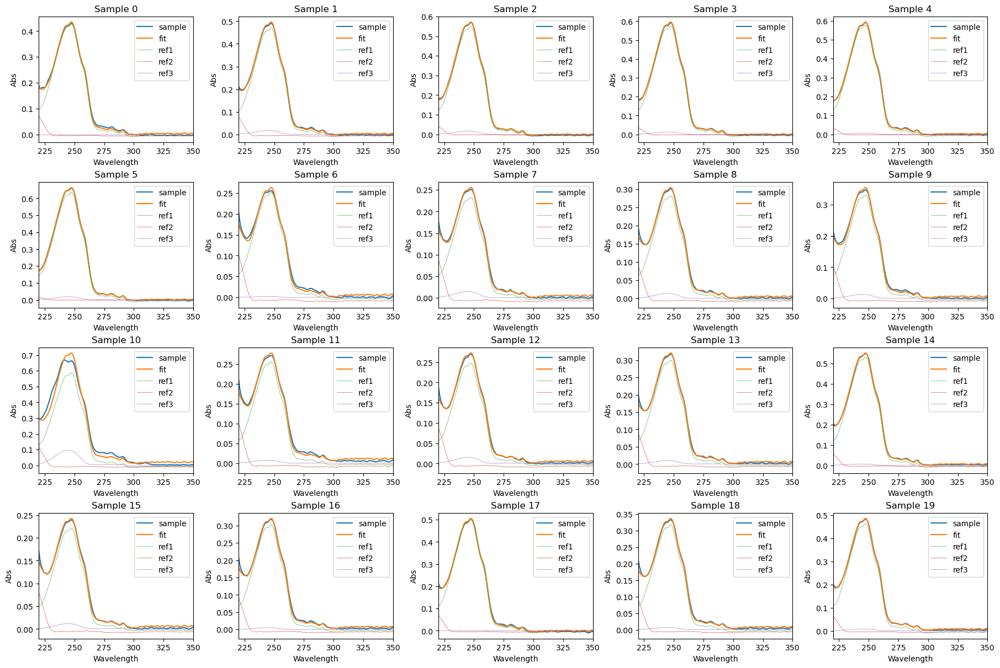

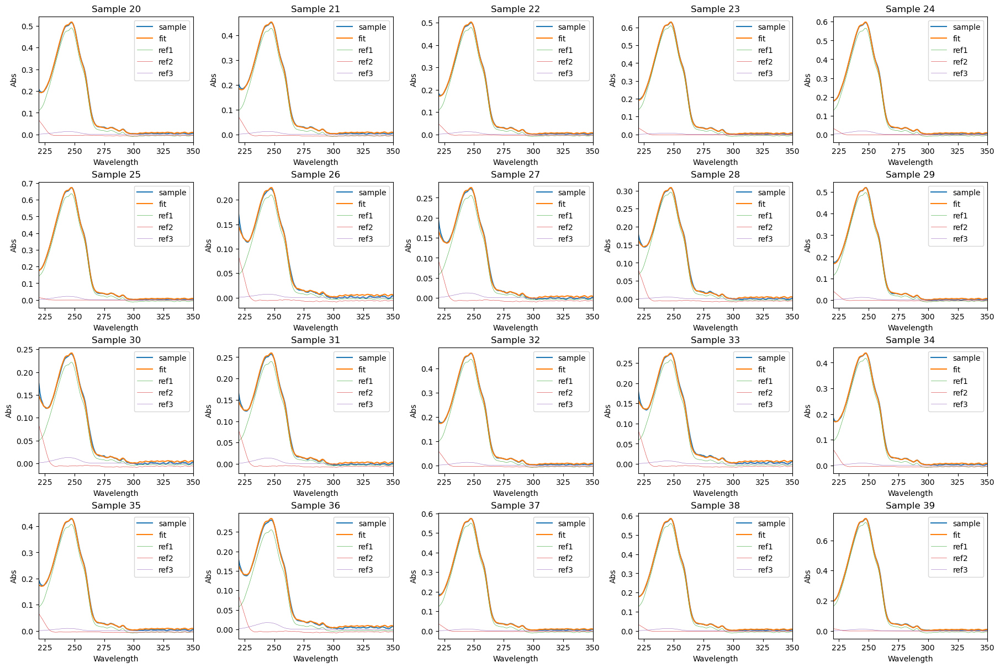

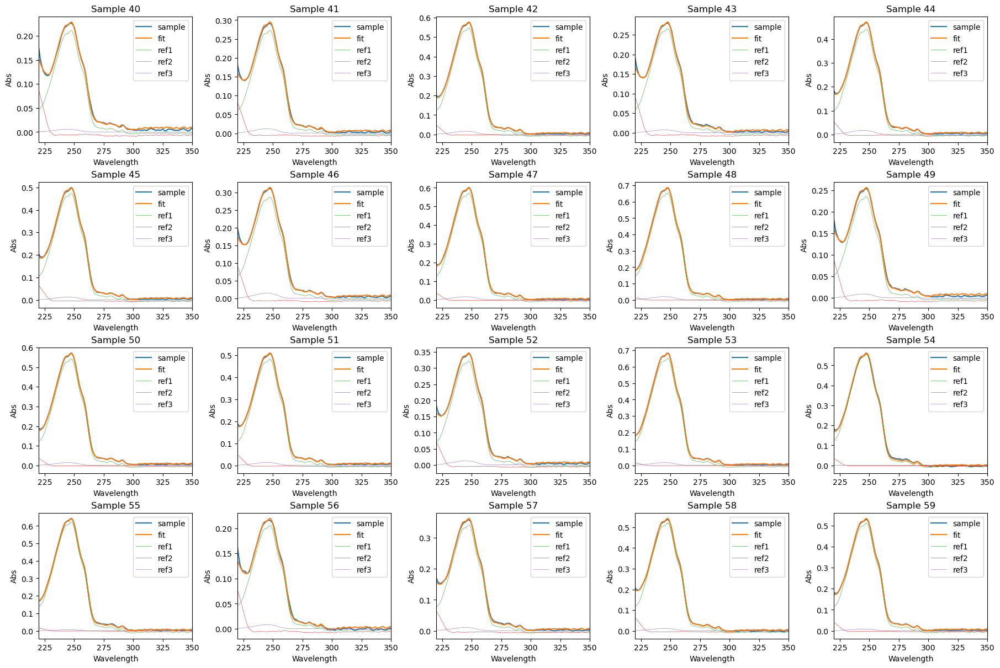

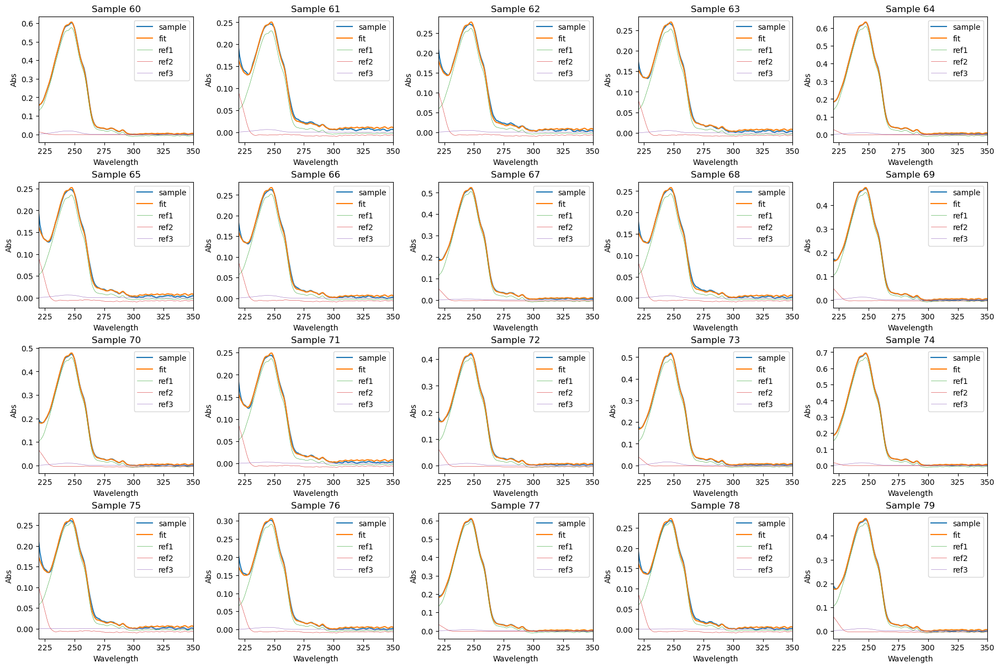

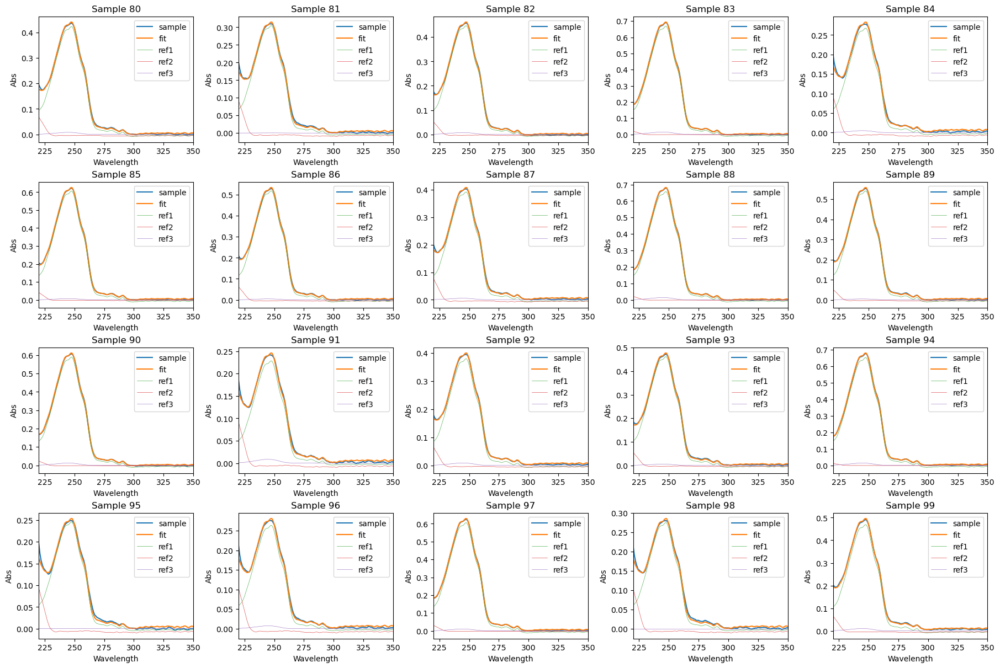

...

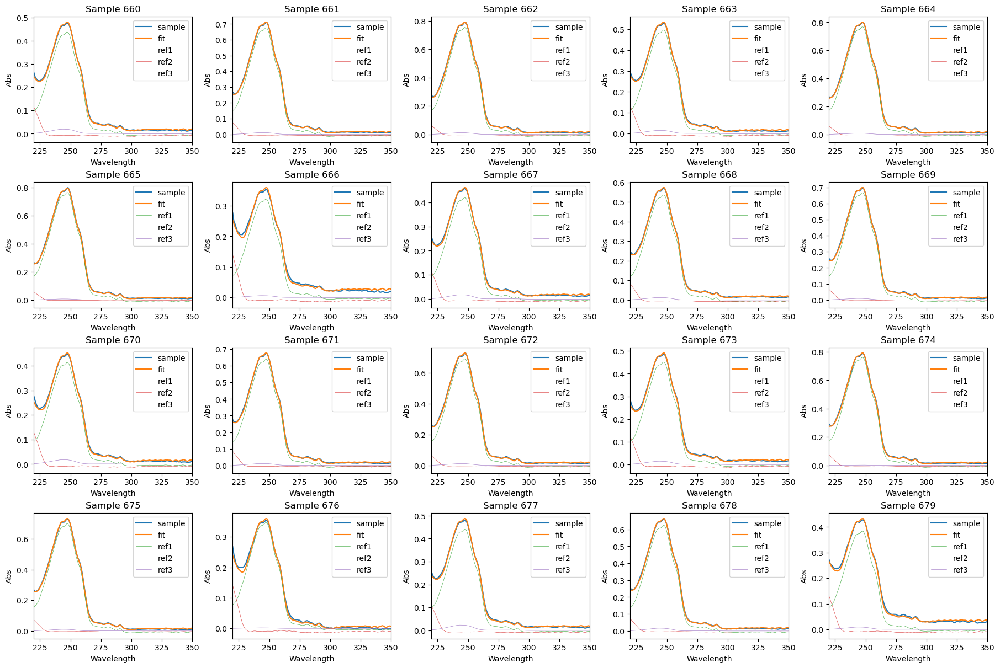

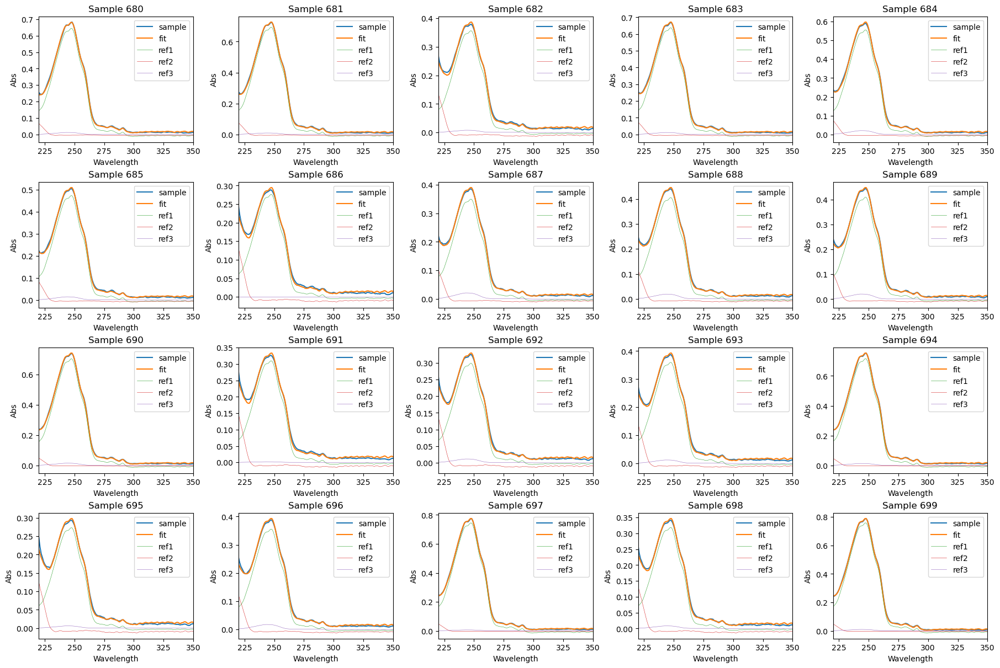

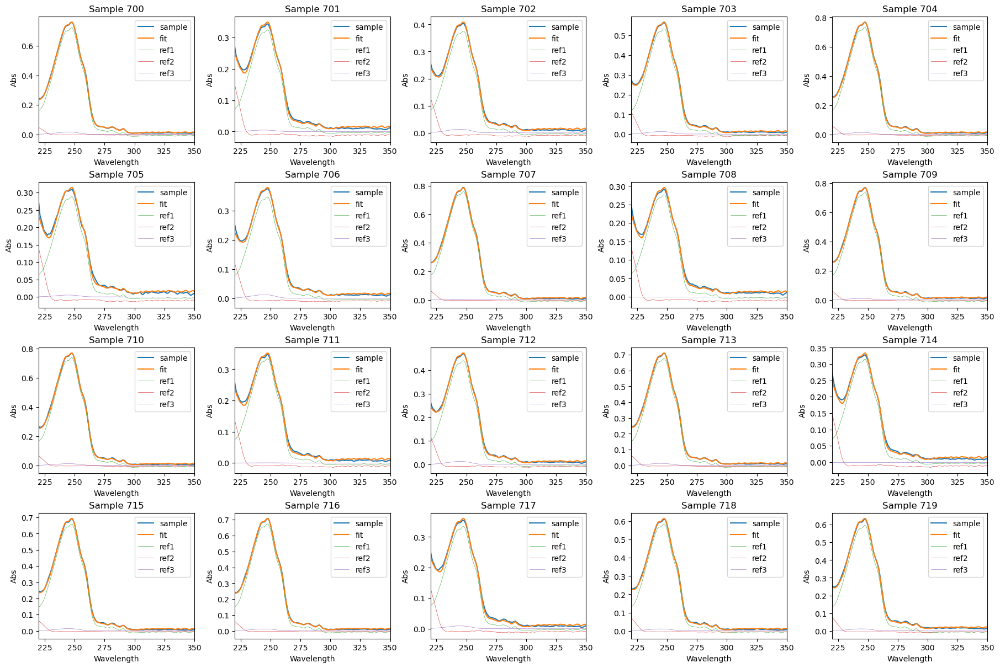

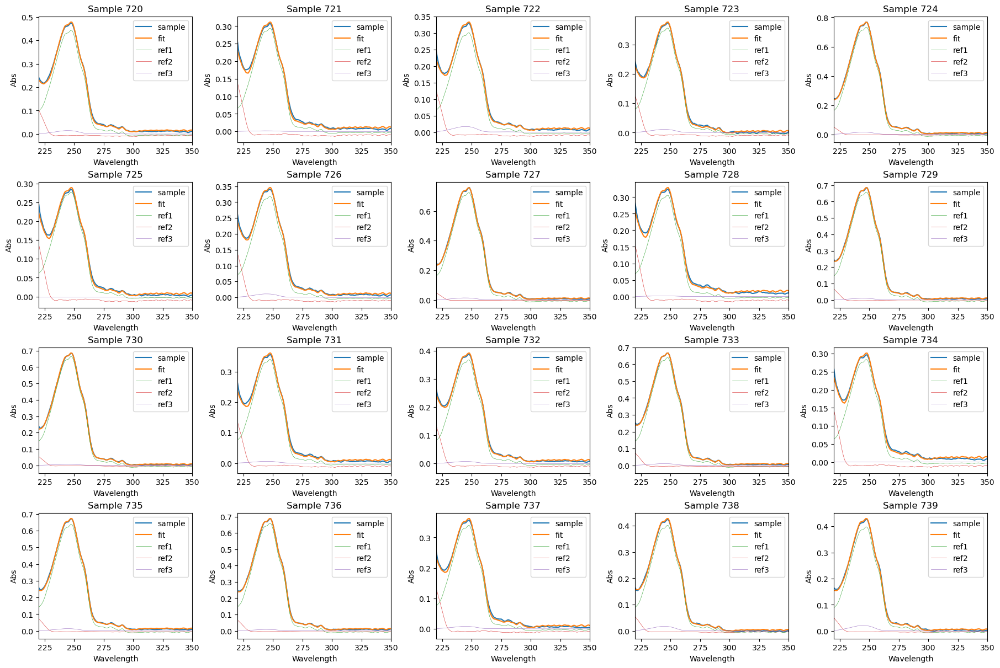

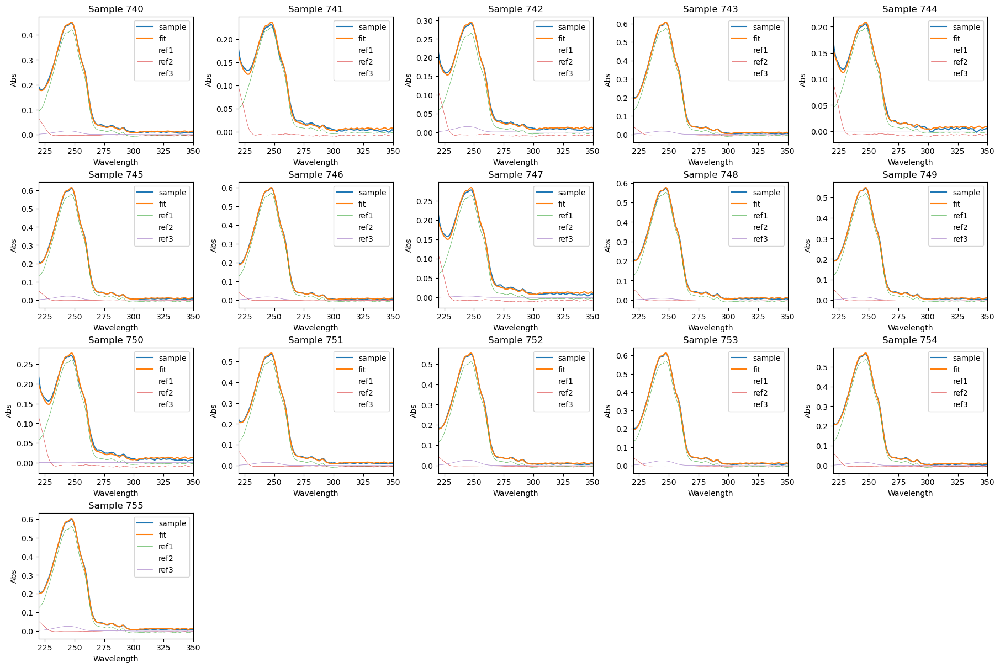

In [222]:
for i in range(len(y.columns)):
    if i % 20 == 0:
        plot_fitting_curve(range(i, min(i + 20, len(y.columns))))
